# Intro

This notebook provides a complete "edge-ready" workflow for performing object detection on high-resolution satellite imagery using limited hardware resources (CPU only). It guides users through setting up the environment, downloading optical imagery of the Port of Rotterdam, and applying a lightweight YOLOv8 model to detect objects within large images using slicing techniques. Finally, the notebook demonstrates how to visualize these detections.

It is designed to be a partial solution, leaving hackathon participants plenty of opportunity for scaling and optimizing.

The evaluation will look at the inference time. In this notebook this is the "Running the Model" section. If you use preprocessing, include this in the inference block so that the execution time remains accurate. We will also evaluate the interpretation and display of results, whether in this notebook, a seperate dashboard, or a static image. Consider the evaluation a balance of speed and utility (your "So what" with the resulting detection).

For a video walkthrough: https://drive.google.com/file/d/1LIg6HTszGtkUfZqGDlh2vc3AIAbWwN0p/view?usp=sharing 

# Set-up

In [1]:
import sys
sys.executable

'/opt/conda/envs/default/bin/python'

In [2]:
!pip install geopandas rasterio shapely folium ultralytics sahi boto3 huggingface_hub -q

In [3]:
# Standard Library Imports
import base64
import glob
import hashlib
import logging
import os
from pathlib import Path
import io
import time
from concurrent.futures import ThreadPoolExecutor

# Data & Image Processing Imports
import matplotlib.pyplot as plt
import numpy as np
import psutil
from PIL import Image
from tqdm.notebook import tqdm

# Geospatial Imports
import folium
import geopandas as gpd
import rasterio
from rasterio.warp import reproject, Resampling, calculate_default_transform
from rasterio.transform import array_bounds
# from osgeo import gdal # GDAL was not working so is removed.
from shapely.geometry import box

# Machine Learning & Cloud Imports
import boto3
import torch
from botocore import UNSIGNED
from botocore.config import Config
from huggingface_hub import hf_hub_download
from sahi import AutoDetectionModel
from sahi.predict import get_sliced_prediction
from sahi.utils.cv import visualize_object_predictions

# Colab Specific
# from google.colab import output

In [4]:
# Adjust logging to be minimal
logging.getLogger("urllib3").setLevel(logging.ERROR)

# For colab
# from google.colab import output
# output.enable_custom_widget_manager()

# Intro to the Workspace
The goal of the challenge is to use a more constrained hardware with limited CPU cores and no GPU.

In [5]:
# Overview of the VM
print("--- Inspecting The Environment ---")

# Check python version
print("Python Version:")
print(sys.version)

# Use os to get CPU cores
cpu_cores = os.cpu_count()
print(f"CPU Cores: {cpu_cores}")

# Check for GPU
is_gpu_available = torch.cuda.is_available()
print(f"GPU Available: {is_gpu_available}")

# Print RAM and storage specs
# RAM Information
ram_info = psutil.virtual_memory()
total_ram_gb = ram_info.total / (1024**3)
print(f"Total RAM: {total_ram_gb:.2f} GB")

# Storage Information
disk_info = psutil.disk_usage('/')
total_disk_gb = disk_info.total / (1024**3)
free_disk_gb = disk_info.free / (1024**3)
print(f"Total Disk Space: {total_disk_gb:.2f} GB")
print(f"Free Disk Space: {free_disk_gb:.2f} GB")

--- Inspecting The Environment ---
Python Version:
3.11.12 | packaged by conda-forge | (main, Apr 10 2025, 22:23:25) [GCC 13.3.0]
CPU Cores: 16
GPU Available: False
Total RAM: 31.16 GB
Total Disk Space: 88.08 GB
Free Disk Space: 62.06 GB


# Download the Data
We will use the Port of Rotterdam and Pan-Sharpened RGB imagery from WorldView-2 with a resolution of 0.5m. Note that this dataset will have some image gaps.  




In [6]:
# 1. Configuration
client_config = Config(signature_version=UNSIGNED, max_pool_connections=20)
s3 = boto3.client('s3', config=client_config)

BUCKET = 'spacenet-dataset'
PREFIX = 'spacenet/SN6_buildings/train/AOI_11_Rotterdam/PS-RGB/'
LOCAL_DIR = os.path.join(str(Path.home()), "rotterdam_opt")

# 2. List Files and Create Task List
print("Listing files...")
paginator = s3.get_paginator('list_objects_v2')
tasks = []

for page in paginator.paginate(Bucket=BUCKET, Prefix=PREFIX):
    if 'Contents' in page:
        for obj in page['Contents']:
            key = obj['Key']
            if key.endswith('/'): continue

            local_path = os.path.join(LOCAL_DIR, key.replace(PREFIX, ""))
            tasks.append((key, local_path))

# Print the total count here
print(f"Total files found: {len(tasks)}")

# 3. Define Download Function
def download_task(task):
    key, path = task
    # Only download if file is missing
    if not os.path.exists(path):
        os.makedirs(os.path.dirname(path), exist_ok=True)
        s3.download_file(BUCKET, key, path)

# 4. Run Parallel Downloads
print(f"Downloading {len(tasks)} images...")
with ThreadPoolExecutor(max_workers=20) as pool:
    list(tqdm(pool.map(download_task, tasks), total=len(tasks)))

# 5. Verify and Retry Missing Files
print("Verifying files...")
missing_tasks = [t for t in tasks if not os.path.exists(t[1])]

if len(missing_tasks) > 0:
    print(f"Retrying {len(missing_tasks)} missing files...")
    # Simple sequential retry for any failures
    for task in tqdm(missing_tasks):
        download_task(task)

print(f"Verified. Total files on disk: {len([t for t in tasks if os.path.exists(t[1])])}")

Listing files...
Total files found: 3401


  0%|          | 0/3401 [00:00<?, ?it/s]

Verifying files...
Verified. Total files on disk: 3401


# Running the Model -- The Speed Evaluation Block
We use a pre-trained YOLOv8 Nano model to demonstrate immediate object detection on CPU for select classes. If you choose to train your own model using the labels found in spacenet/SN6_buildings/train/AOI_11_Rotterdam/summaryData/, we recommend prioritizing lightweight architectures to focus on speed. As we do not provide a GPU, we do not expect teams to train models. But we do encourage looking for other pretrained models that may be more accurate.

In [8]:
# 1. Setup Model
model_path = hf_hub_download(repo_id="pauhidalgoo/yolov8-DIOR", filename="DIOR_yolov8n_backbone.pt")
detection_model = AutoDetectionModel.from_pretrained(
    model_type='yolov8', model_path=model_path, confidence_threshold=0.4, device="cpu"
)

In [9]:
# EVALUATION BLOCK.

# 2. Setup Data
folder = "rotterdam_opt"
files = sorted(glob.glob(os.path.join(folder, "*.tif")))[:10]
geo_detections = []

# Create a storage for the raw results
inference_cache = {}

# 3. Process Loop (Inference Only)
print(f"Starting inference on {len(files)} images...")

# --- ADDITION: Start Timer ---
start_time = time.time()

for path in tqdm(files, desc="Detecting"):
    # Open and Read
    src = rasterio.open(path)
    img = src.read([1, 2, 3]).transpose(1, 2, 0)
    transform = src.transform

    # Normalize
    p2, p98 = np.percentile(img, (2, 98))
    img = np.clip((img - p2) / (p98 - p2) * 255.0, 0, 255).astype(np.uint8)
    img_contiguous = np.ascontiguousarray(img)

    # Predict
    result = get_sliced_prediction(
        Image.fromarray(img_contiguous), detection_model,
        slice_height=512, slice_width=512, overlap_height_ratio=0.1, verbose=0
    )

    inference_cache[path] = result

    # Georeference results
    for det in result.object_prediction_list:
        x1, y1 = transform * (det.bbox.minx, det.bbox.miny)
        x2, y2 = transform * (det.bbox.maxx, det.bbox.maxy)

        geo_detections.append({
            'geometry': box(min(x1, x2), min(y1, y2), max(x1, x2), max(y1, y2)),
            'label': det.category.name,
            'score': round(det.score.value, 2),
            'file': os.path.basename(path)
        })

    src.close()

end_time = time.time()
total_inference_time = end_time - start_time

print(f"Done! Saved {len(geo_detections)} detections.")
print(f"Total inference time to be submitted to evaluators: {total_inference_time:.2f} seconds")

Starting inference on 10 images...


Detecting:   0%|          | 0/10 [00:00<?, ?it/s]

Done! Saved 153 detections.
Total inference time to be submitted to evaluators: 10.90 seconds


# Visualize the Results
We use a simple plot to showcase bounding boxes, labels, and accuracy.

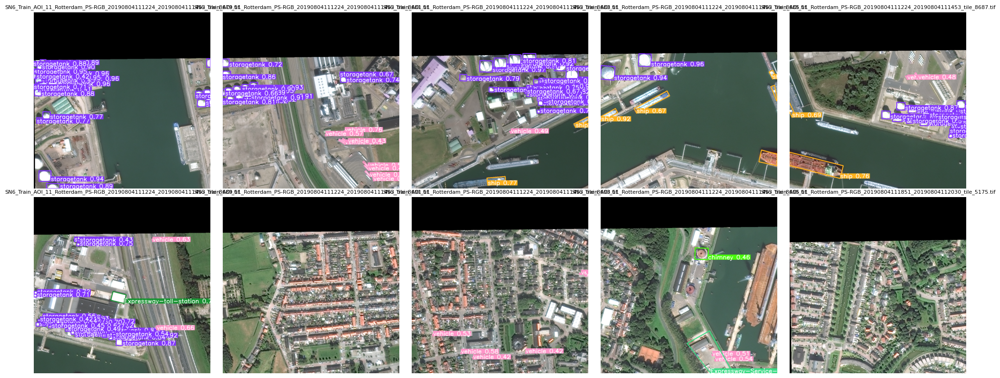

In [10]:
# Select the first 10 file paths to visualize
subset_paths = files[0:10]

# Create a grid of plots (2 rows, 5 columns)
fig, axes = plt.subplots(2, 5, figsize=(20, 8))
axes = axes.flatten()

for i, current_path in enumerate(subset_paths):
    # 1. Load the image for display
    with rasterio.open(current_path) as src:
        img = src.read([1, 2, 3]).transpose(1, 2, 0)

    # 2. Normalize for visuals
    p2, p98 = np.percentile(img, (2, 98))
    div = (p98 - p2) if (p98 - p2) > 0 else 1
    img = np.clip((img - p2) / div * 255.0, 0, 255).astype(np.uint8)
    img_contiguous = np.ascontiguousarray(img)

    # 3. Retrieve the result
    result = inference_cache[current_path]

    # 4. Draw the boxes onto the image using the predictions
    vis_output = visualize_object_predictions(
        image=img_contiguous,
        object_prediction_list=result.object_prediction_list
    )
    vis_img = vis_output["image"]

    # 5. Plot the result
    ax = axes[i]
    ax.imshow(vis_img)
    ax.axis('off')
    ax.set_title(os.path.basename(current_path), fontsize=8)

plt.tight_layout()
plt.show()

# More Advanced Visualization -- The Insights Evaluation Block
We will demo a basic map with the original images and added bounding boxes. Your output can be in any format you like and it does not need to come from a notebook. Just be sure the evaluation team can access it.


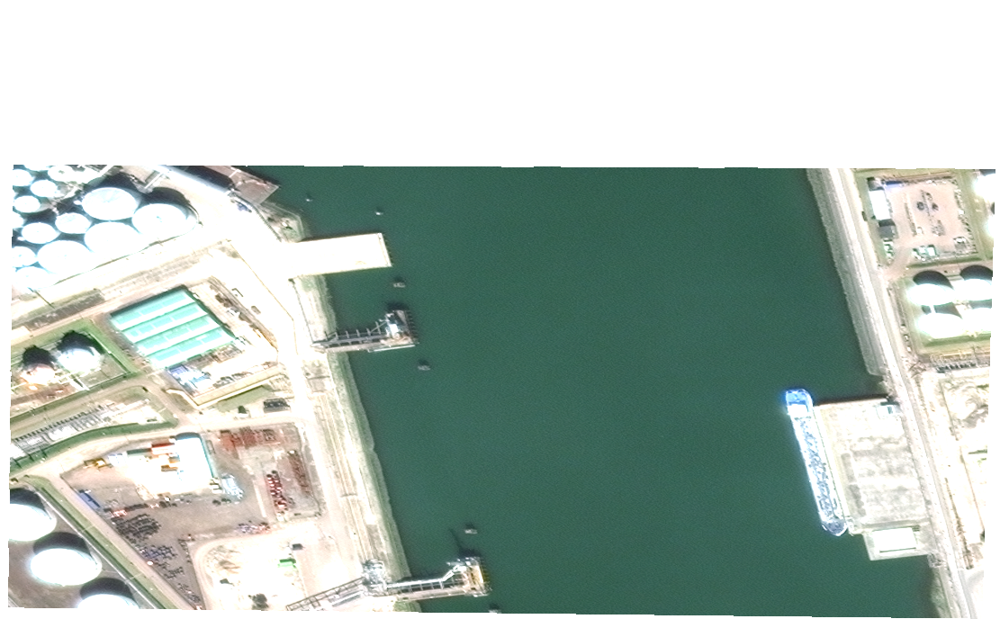
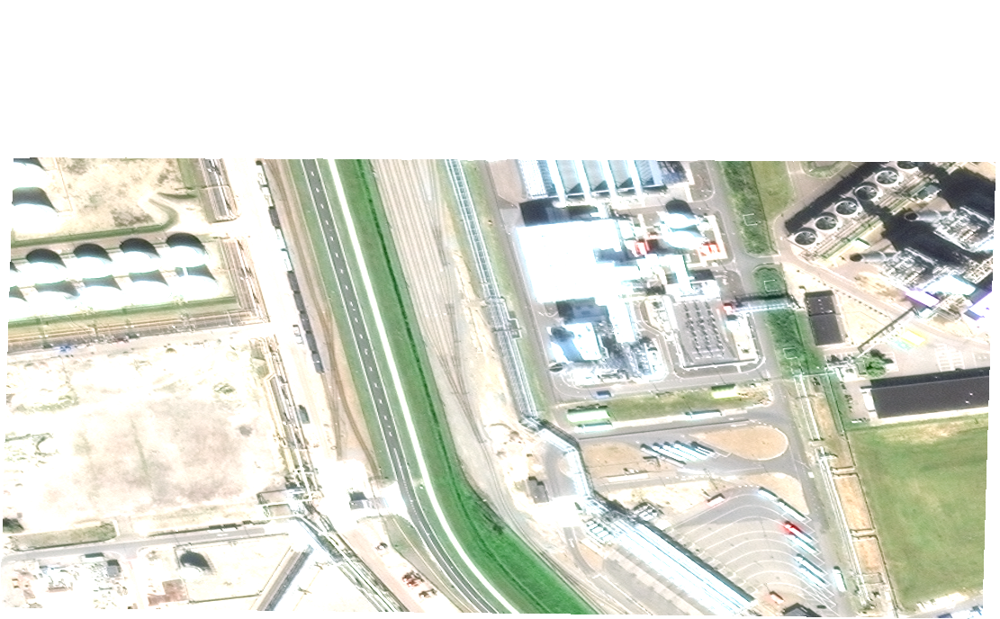
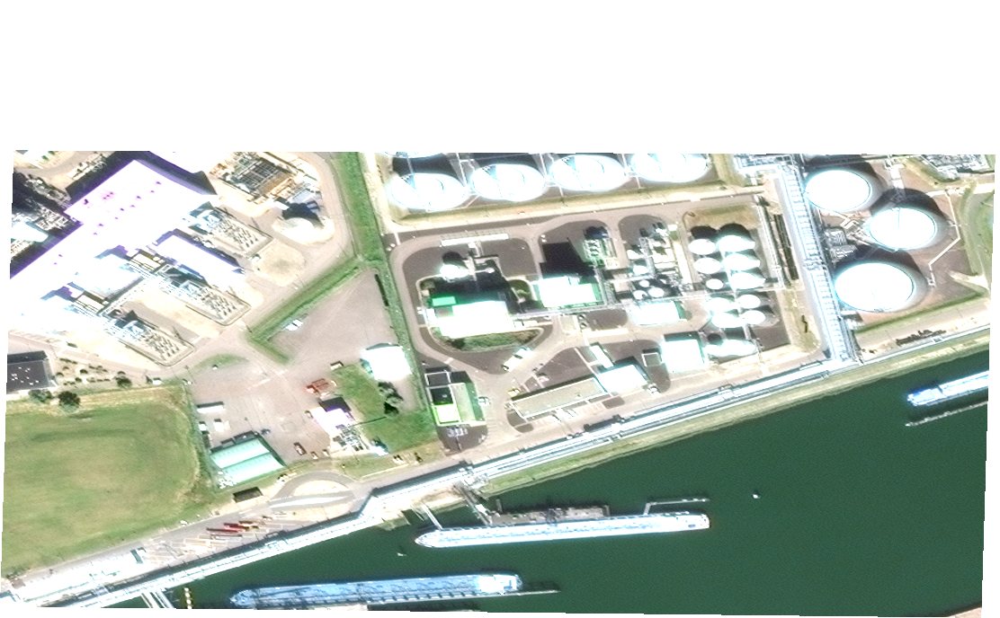
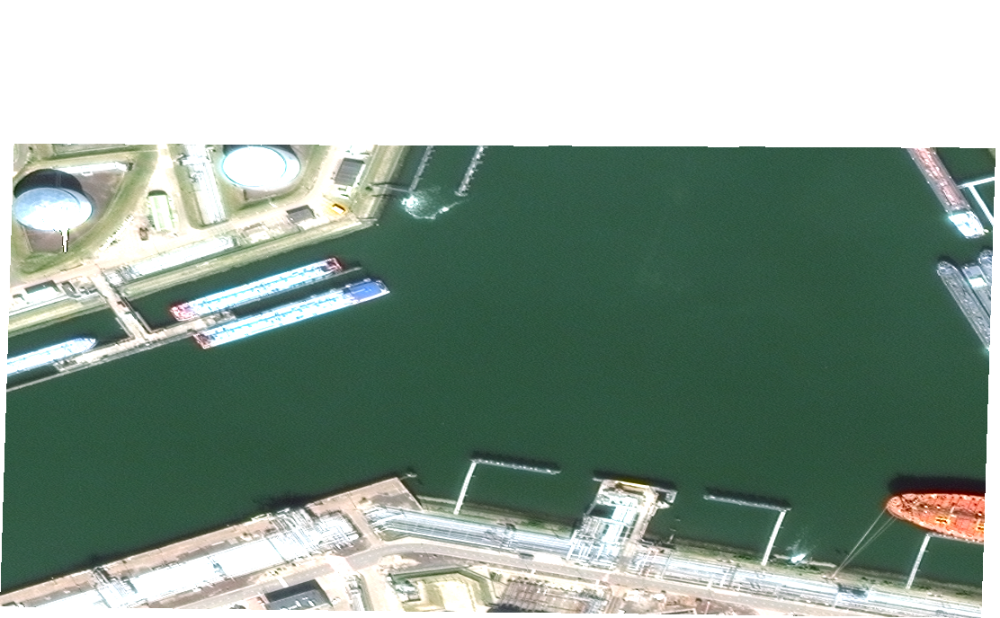
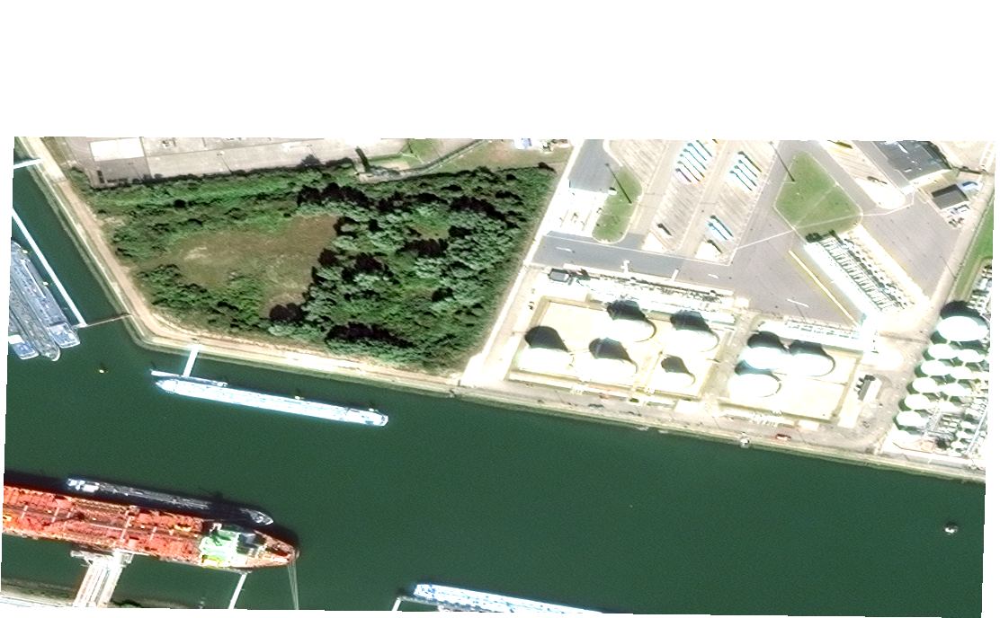
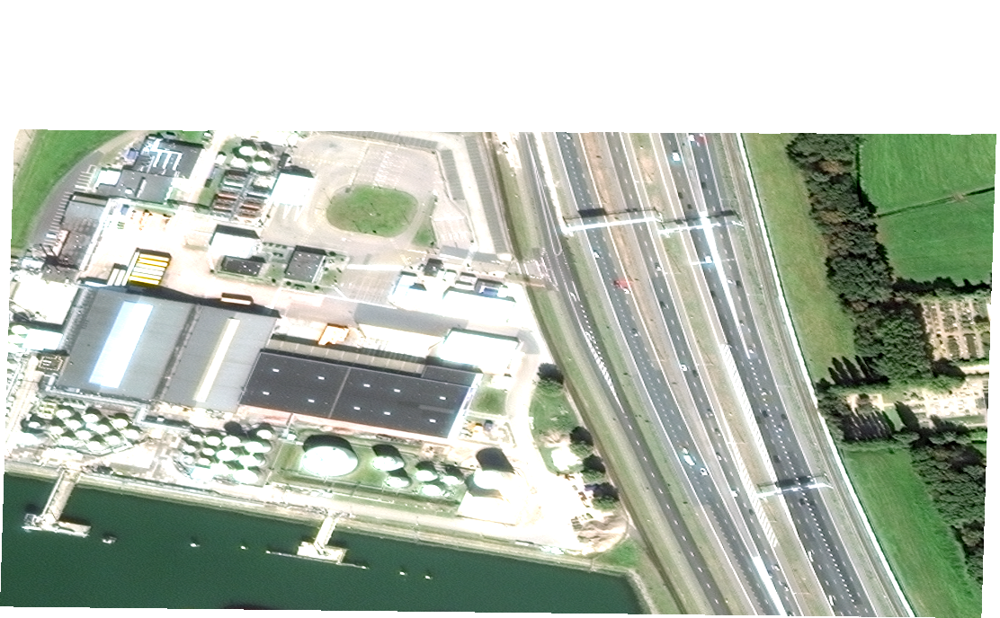
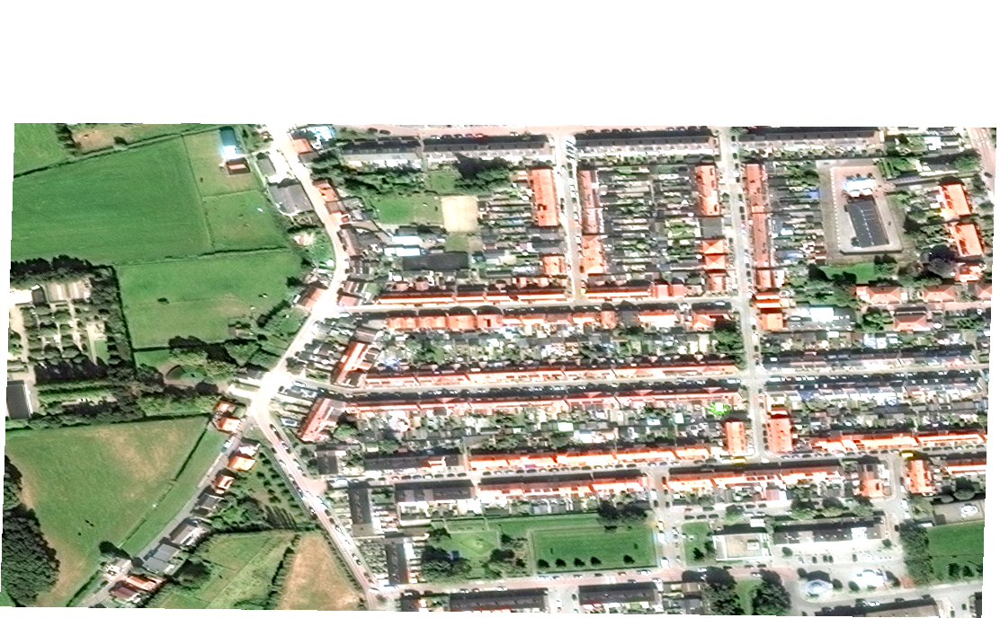
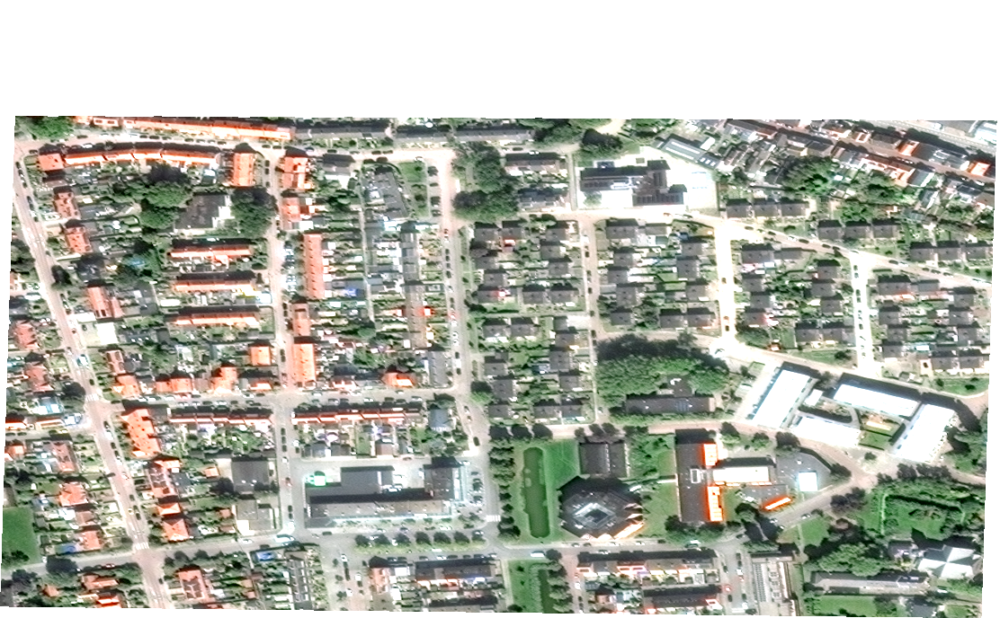
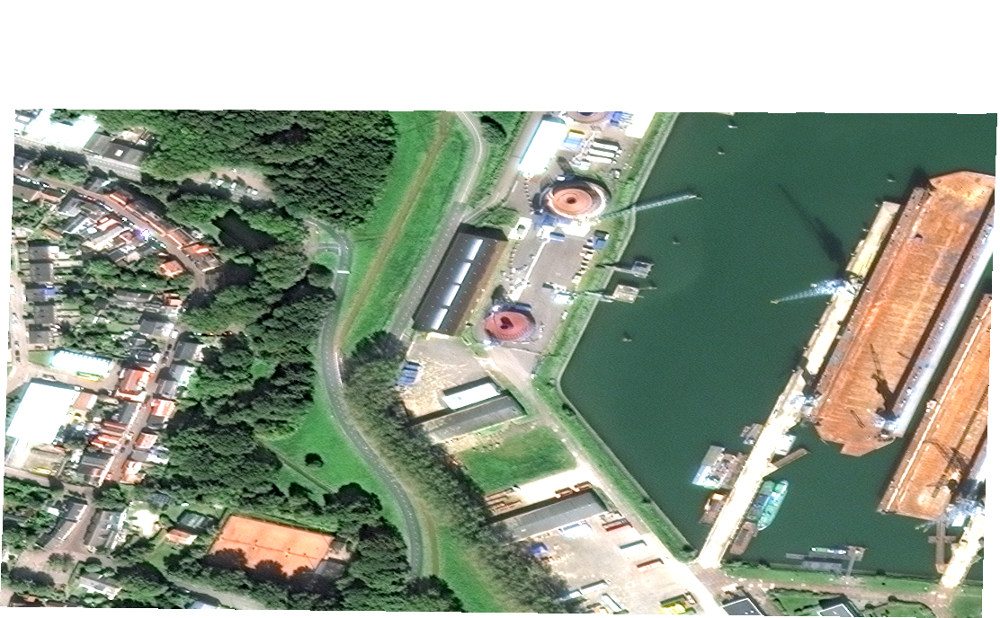
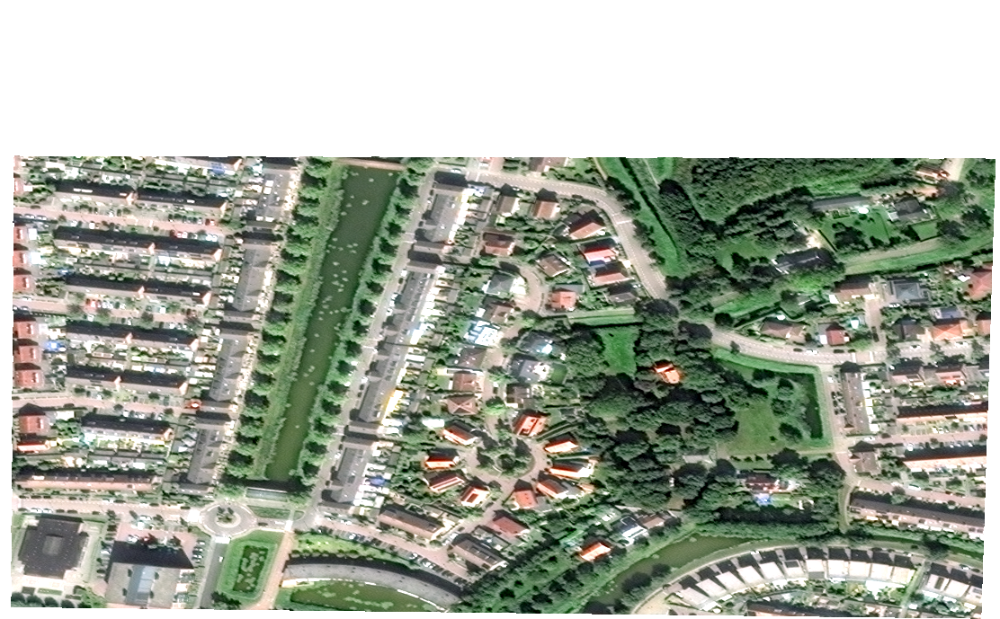

In [11]:
# Be aware that this may crash if you try to add all 3000+ images to a map with this strategy!
# We are looking for your solutions to scale the outputs to the complete scene
with rasterio.open(files[0]) as src:
    source_crs = src.crs
    dst_crs = 'EPSG:4326' # Needed for mapping
    transform, width, height = calculate_default_transform(src.crs, dst_crs, src.width, src.height, *src.bounds)
    left, bottom, right, top = array_bounds(height, width, transform)
    center = [(bottom + top) / 2, (left + right) / 2]

m = folium.Map(location=center, zoom_start=18, tiles='Esri.WorldImagery')

for i, tiff_path in enumerate(files):
    with rasterio.open(tiff_path) as src:
        # Get the nodata value from the source, or default to 0 if not present
        nodata_val = src.nodata if src.nodata is not None else 0

        # Calculate the transform and dimensions for the output in EPSG:4326
        dst_crs = 'EPSG:4326'
        transform, width, height = calculate_default_transform(
            src.crs, dst_crs, src.width, src.height, *src.bounds)

        destination = np.zeros((src.count, height, width), dtype=src.dtypes[0])

        # Reproject the image, filling nodata areas with the same value
        reproject(
            source=rasterio.band(src, range(1, src.count + 1)),
            destination=destination,
            dst_transform=transform,
            dst_crs=dst_crs,
            dst_nodata=nodata_val,  # Preserve nodata value
            resampling=Resampling.bilinear
        )

        # Move bands to the last axis for processing
        img_data = np.moveaxis(destination, 0, -1)

        # Perform contrast stretching
        scaled_data = (img_data.astype(np.float32) - 23) * 255.0 / (150 - 23)
        scaled_data = np.clip(scaled_data, 0, 255).astype(np.uint8)

        # --- FIX #1: Handle Nodata Transparency ---
        # Create a mask where the original reprojected data was nodata
        # We check the first band; nodata applies to all bands.
        mask = (destination[0] == nodata_val)

        # Create an alpha channel: 255 (opaque) where there is data, 0 (transparent) where there is not.
        alpha = np.where(mask, 0, 255).astype(np.uint8)

        # Prepare the RGB channels
        if scaled_data.shape[2] == 1: # For grayscale images
            rgb_data = np.dstack((scaled_data, scaled_data, scaled_data))
        else: # For multi-band (RGB) images
            rgb_data = scaled_data[..., :3] # Ensure it's only 3 bands

        # Stack the RGB and Alpha channels together to create an RGBA image
        rgba_data = np.dstack((rgb_data, alpha))
        img = Image.fromarray(rgba_data, 'RGBA')

        buffer = io.BytesIO()
        img.save(buffer, format='PNG')

        # --- FIX #2: Calculate Precise Bounds for the Warped Image ---
        # This prevents misalignment and overlap artifacts.
        b_left, b_bottom, b_right, b_top = array_bounds(height, width, transform)
        bounds = [[b_bottom, b_left], [b_top, b_right]]

        encoded = base64.b64encode(buffer.getvalue()).decode('utf-8')

        folium.raster_layers.ImageOverlay(
            image=f"data:image/png;base64,{encoded}",
            bounds=bounds,
            name=f"Image {i}"
        ).add_to(m)

# Prepare the predictions
gdf = gpd.GeoDataFrame(geo_detections, crs=source_crs)
gdf = gdf.to_crs(epsg=4326)

# Adjust as needed, or define your own color scheme.
def get_color(label):
    return '#' + hashlib.md5(str(label).encode()).hexdigest()[:6]

folium.GeoJson(
    gdf,
    name="Detections",
    style_function=lambda x: {
        'color': get_color(x['properties']['label']),
        'weight': 2,
        'fillOpacity': 0.2,
        'fillColor': get_color(x['properties']['label'])
    },
    tooltip=folium.GeoJsonTooltip(
        fields=['label', 'score'],
        aliases=['Object:', 'Confidence:'],
        localize=True
    )
).add_to(m)

folium.LayerControl().add_to(m)
m

# Helpful Hints
To elevate your solution from a simple detection model to a comprehensive situational awareness tool, consider the following areas:

**1. Preprocessing and managing compute**
Is there a faster way to discard images unlikely to have and desired objects? What steps could help reduce the total inference needed? Any off-the-shelf masking tools available? How do you work around RAM bottlenecks?

**2. Data Enrichment**
Don't rely on imagery alone. Augment your detections with external datasets to provide context:
OpenStreetMap (OSM): Use road networks to determine mobility corridors or building footprints to validate detection accuracy.
Elevation Data (DEM/DSM): Incorporate terrain height to analyze vantage points or flood risks in low-lying areas like Rotterdam.
Weather History: Does weather play a role?


**3. Visualization Strategy**
High-resolution satellite imagery is heavy. How will your end-user interact with it seamlessly?
Implement Image Pyramiding and Tiling to ensure smooth zooming and panning.
Consider converting outputs to Cloud Optimized GeoTIFFs (COGs) for efficient streaming.
Focus on the "Level of Detail" show cluster markers at high altitudes and specific bounding boxes only when zoomed in.


**4. Tactical Utility (The "So What?")**
Analyze the spatial arrangement of detected objects to identify critical lines of sight, cover availability, concealment, and mobility corridors that inform both defensive positioning and offensive maneuvering. Are there military equipment specs that could be combined with the results for a more actionable plan or risk evaluation?
